In [1]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import CSVLogger
from tensorflow.keras import backend as K
# from tensorflow.keras.metrics import *

from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

In [2]:
def build_augmentation(is_train=True):
    if is_train:    # 훈련용 데이터일 경우
        return Compose([
            HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
            RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                min_max_height=(300, 370),
                w2h_ratio=370/1242,
                height=224,
                width=224,
                p=0.5
                ),
            Resize(              # 입력이미지를 224X224로 resize
                width=224,
                height=224
                )
            ])
    
    return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
        Resize(
            width=224,
            height=224
            )
        ])

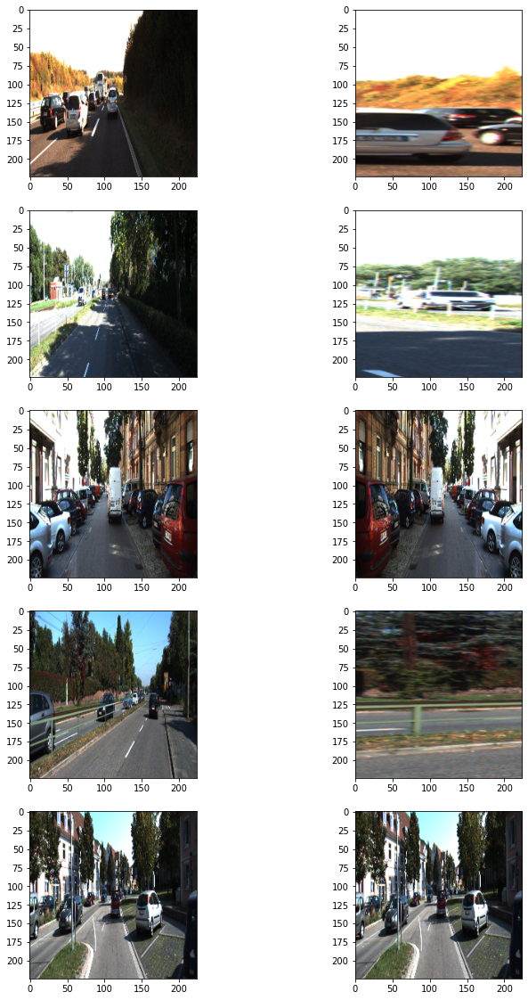

In [3]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지

plt.show()

In [4]:
class KittiGenerator(tf.keras.utils.Sequence):
    '''
    KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
    우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
    '''
    def __init__(self, 
               dir_path,
               batch_size=8,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
        '''
        dir_path: dataset의 directory path입니다.
        batch_size: batch_size입니다.
        img_size: preprocess에 사용할 입력이미지의 크기입니다.
        output_size: ground_truth를 만들어주기 위한 크기입니다.
        is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
        augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
        # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-30]
        return data[-30:]

    def __len__(self):
        # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
        # 입력과 출력을 만듭니다.
        # 입력은 resize및 augmentation이 적용된 input image이고 
        # 출력은 semantic label입니다.
        batch_data = self.data[
                               index*self.batch_size:
                               (index + 1)*self.batch_size
                               ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])

        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            ## 도로이면 1 아니면 0
            _output = (_output==7).astype(np.uint8)*1
            data = {
                "image": _input,
                "mask": _output,
                }
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
            return inputs, outputs

    def on_epoch_end(self):
        # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
        self.indexes = np.arange(len(self.data))
        if self.is_train == True :
            np.random.shuffle(self.indexes)
            return self.indexes

In [5]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

In [6]:
np.ndarray(
    shape=(8,224,224,3),
    buffer = test_generator.__getitem__(0)[0]
).shape

(8, 224, 224, 3)

In [7]:
train_generator.__getitem__(0)[1].shape

(8, 224, 224)

input size = (224, 224, 3)   
output size = (224, 224)  

### Step 2-1.  U-Net 모델의 구현

In [8]:
# def double_conv_block(x, n_filters):
#     # Conv2D then ReLU activation
#     x = Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
#     # Conv2D then ReLU activation
#     x = Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
#     return x

# def downsample_block(x, n_filters):
#     f = double_conv_block(x, n_filters)
#     p = MaxPool2D(2)(f)
#     p = Dropout(0.3)(p)

#     return f, p

# def upsample_block(x, conv_features, n_filters):
#     # upsample
#     x = Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
#     # concatenate
#     x = concatenate([x, conv_features])
#     # dropout
#     x = Dropout(0.3)(x)
#     # Conv2D twice with ReLU activation
#     x = double_conv_block(x, n_filters)

#     return x

In [9]:
# def build_unet_model(input_shape=(224, 224, 3)):
#     inputs = Input(input_shape)

#     # encoder: contracting path - downsample
#     # 1 - downsample
#     f1, p1 = downsample_block(inputs, 64)
#     # 2 - downsample
#     f2, p2 = downsample_block(p1, 128)
#     # 3 - downsample
#     f3, p3 = downsample_block(p2, 256)
#     # 4 - downsample
#     f4, p4 = downsample_block(p3, 512)

#     # 5 - bottleneck
#     bottleneck = double_conv_block(p4, 1024)

#     # decoder: expanding path - upsample
#     # 6 - upsample
#     u6 = upsample_block(bottleneck, f4, 512)
#     # 7 - upsample
#     u7 = upsample_block(u6, f3, 256)
#     # 8 - upsample
#     u8 = upsample_block(u7, f2, 128)
#     # 9 - upsample
#     u9 = upsample_block(u8, f1, 64)

#     # outputs
#     outputs = Conv2D(1, (1, 1), activation='sigmoid')(u9)  # 이진 분류로 가정한 경우

#     # unet model with Keras Functional API
#     unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

#     return unet_model

In [10]:
num_classes = 1

In [5]:
def build_unet_model(input_shape=(224, 224, 3), num_classes = 1):
    inputs = Input(input_shape)
    
    # Encoder (Downsampling)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Dropout(0.1)(c3)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Dropout(0.1)(c4)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    
    # Bottleneck
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Dropout(0.1)(c5)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)
    
    # Decoder (Upsampling)
    u6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = Dropout(0.1)(c6)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)
    
    u7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = Dropout(0.1)(c7)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)
    
    u8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)
    
    u9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)
    
    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid')(c9)  # 이진 분류로 가정한 경우
    
    model = Model(inputs=[inputs], outputs=[outputs])
    return model

### Step 2-2.  U-Net++ 모델의 구현

In [6]:
def build_unet_plus2_model(input_shape=(224,224,3), nb_filter = [32,64,128,256,512], num_classes = 1):
    # Build U-Net++ model
    inputs = Input(input_shape)
    s = Lambda(lambda x: x / 255) (inputs)


    c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
    c1 = Dropout(0.2)(c1)
    c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
    c1 = Dropout(0.2)(c1)
    p1 = MaxPooling2D((2, 2), strides=(2, 2)) (c1)

    c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
    c2 = Dropout(0.2)(c2)
    c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
    c2 = Dropout(0.2)(c2)
    p2 = MaxPooling2D((2, 2), strides=(2, 2)) (c2)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(c2)
    conv1_2 = concatenate([up1_2, c1], name='merge12', axis=3)
    c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
    c3 = Dropout(0.2)(c3)

    conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
    conv3_1 = Dropout(0.2)(conv3_1)
    conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_1)
    conv3_1 = Dropout(0.2)(conv3_1)
    pool3 = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, c2], name='merge22', axis=3) #x10
    conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
    conv2_2 = Dropout(0.2)(conv2_2)
    conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
    conv2_2 = Dropout(0.2)(conv2_2)

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, c1, c3], name='merge13', axis=3)
    conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
    conv1_3 = Dropout(0.2)(conv1_3)
    conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
    conv1_3 = Dropout(0.2)(conv1_3)

    conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool3)
    conv4_1 = Dropout(0.2)(conv4_1)
    conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_1)
    conv4_1 = Dropout(0.2)(conv4_1)
    pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=3) #x20
    conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
    conv3_2 = Dropout(0.2)(conv3_2)
    conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
    conv3_2 = Dropout(0.2)(conv3_2)

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, c2, conv2_2], name='merge23', axis=3)
    conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
    conv2_3 = Dropout(0.2)(conv2_3)
    conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
    conv2_3 = Dropout(0.2)(conv2_3)

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, c1, c3, conv1_3], name='merge14', axis=3)
    conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
    conv1_4 = Dropout(0.2)(conv1_4)
    conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
    conv1_4 = Dropout(0.2)(conv1_4)

    conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool4)
    conv5_1 = Dropout(0.2)(conv5_1)
    conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv5_1)
    conv5_1 = Dropout(0.2)(conv5_1)

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=3) #x30
    conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
    conv4_2 = Dropout(0.2)(conv4_2)
    conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
    conv4_2 = Dropout(0.2)(conv4_2)

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=3)
    conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
    conv3_3 = Dropout(0.2)(conv3_3)
    conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
    conv3_3 = Dropout(0.2)(conv3_3)

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, c2, conv2_2, conv2_3], name='merge24', axis=3)
    conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
    conv2_4 = Dropout(0.2)(conv2_4)
    conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
    conv2_4 = Dropout(0.2)(conv2_4)

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, c1, c3, conv1_3, conv1_4], name='merge15', axis=3)
    conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
    conv1_5 = Dropout(0.2)(conv1_5)
    conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
    conv1_5 = Dropout(0.2)(conv1_5)

    nestnet_output_4 = Conv2D(num_classes, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal',  name='output_4', padding='same')(conv1_5)

    model = Model([inputs], [nestnet_output_4])
    
    return model

### Step 2-3. U-Net 학습

In [13]:
epoch = 100

In [14]:
UNet = build_unet_model()
UNet.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 224, 224, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       dropout[0][0]                    
______________________________________________________________________________________________

In [23]:
unet_model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet.h5'
unet_model_dir = os.getenv('HOME') + '/aiffel/semantic_segmentation/checkpoints_unet/'

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(unet_model_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    ), 
    CSVLogger('training_unet.log')
]

UNet.compile(
    optimizer = Adam(1e-4), 
    loss = 'binary_crossentropy',
    metrics = [
#         tf.keras.metrics.MeanIoU(num_classes=2), 
        "accuracy" ## "binary_accuracy"
    ]
)

history_UNet = UNet.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=epoch,
    callbacks=callbacks_list
 )

UNet.save(unet_model_path)  

Epoch 1/100
22/22 [==============================] - 10s 379ms/step - loss: 0.0843 - accuracy: 0.9737 - val_loss: 0.0575 - val_accuracy: 0.9661

Epoch 00001: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_1
Epoch 2/100
22/22 [==============================] - 8s 370ms/step - loss: 0.0567 - accuracy: 0.9730 - val_loss: 0.0520 - val_accuracy: 0.9661

Epoch 00002: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_2
Epoch 3/100
22/22 [==============================] - 8s 371ms/step - loss: 0.0868 - accuracy: 0.9754 - val_loss: 0.0852 - val_accuracy: 0.9661

Epoch 00003: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_3
Epoch 4/100
22/22 [==============================] - 8s 371ms/step - loss: 0.0518 - accuracy: 0.9778 - val_loss: 0.0777 - val_accuracy: 0.9661

Epoch 00004: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_4
Epoch 5/100
22/22 [========

처음엔 valid mean iou만 일정한 값이 나오더니  
이젠 valid acc 마저도 일정한 값이 나온다..  어 아니네ㅎㅎ  
valid set이 이상하게 담겨져잇다는걸 알고 있으니 일단 넘어가자   

#### 에러와의 전쟁

In [24]:
UNet.predict(test_generator.__getitem__(0)[0]).shape
# m = tf.keras.metrics.MeanIoU(num_classes=2)
# m.update_state(
#     UNet.predict(test_generator.__getitem__(0)[0]), 
#     test_generator.__getitem__(0)[1]
# )
# m.result().numpy()

(8, 224, 224, 1)

In [25]:
test_generator.__getitem__(0)[1].shape

(8, 224, 224)

Text(0.5, 1.0, 'input label')

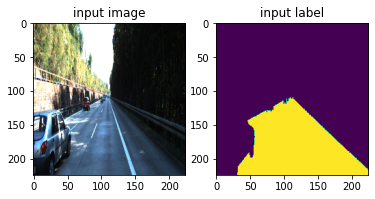

In [26]:
plt.subplot(1,2,1)
plt.imshow(test_generator.__getitem__(3)[0][0, :, :])
plt.title("input image")
plt.subplot(1,2,2)
plt.imshow(test_generator.__getitem__(3)[1][0, :, :])
plt.title("input label")

Text(0.5, 1.0, 'input label')

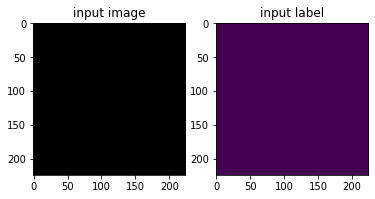

In [27]:
plt.subplot(1,2,1)
plt.imshow(test_generator.__getitem__(3)[0][2, :, :])
plt.title("input image")
plt.subplot(1,2,2)
plt.imshow(test_generator.__getitem__(3)[1][2, :, :])
plt.title("input label")

valid set의 각 batch의 첫번째 이미지를 제외한 나머지는 모두 이미지가 나오지 않는다.  
그래서 mean iou가 고정값이었을수도...  

In [28]:
test_generator.__getitem__(3)[0][2, :, :].shape

(224, 224, 3)

In [29]:
test_generator.__getitem__(3)[1][2, :, :].shape

(224, 224)

In [30]:
np.max(test_generator.__getitem__(3)[1][2, :, :])

0.0

In [31]:
test_generator.__getitem__(0)[1][0, :, :]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

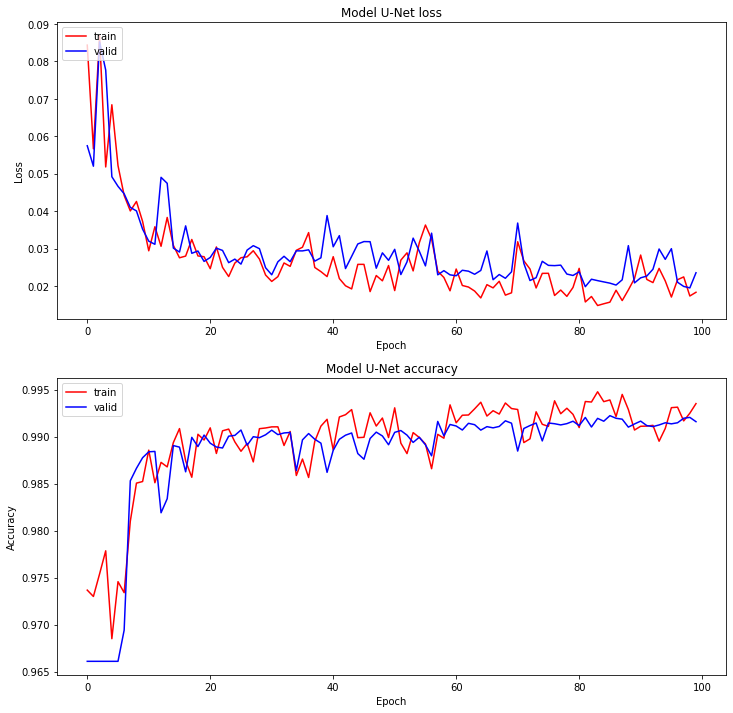

In [32]:
import matplotlib.pyplot as plt
import pandas as pd
training_unet_log = pd.read_csv("training_unet.log")

plt.figure(figsize=(12,12))
plt.subplot(2,1,1)
plt.plot(training_unet_log['loss'], 'r')
plt.plot(training_unet_log['val_loss'], 'b')
plt.title('Model U-Net loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
# plt.ylim(0,0.2)
plt.legend(['train', 'valid'], loc='upper left')

# plt.subplot(3,1,2)
# plt.plot(training_unet_log['mean_io_u'], 'r')
# plt.plot(training_unet_log['val_mean_io_u'], 'b')
# plt.title('Model U-Net mean_io_u')
# plt.ylabel('Mean IoU')
# plt.xlabel('Epoch')
# plt.legend(['train', 'valid'], loc='upper left')

plt.subplot(2,1,2)
plt.plot(training_unet_log['accuracy'], 'r')
plt.plot(training_unet_log['val_accuracy'], 'b')
plt.title('Model U-Net accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'valid'], loc='upper left')

plt.show()

val loss는 아직 수렴 중인 것 같다.  

### Step 2-4. U-Net++ 학습

In [33]:
UNet_plus2 = build_unet_plus2_model()
UNet_plus2.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 224, 224, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_19 (Conv2D)              (None, 224, 224, 32) 896         lambda[0][0]                     
__________________________________________________________________________________________________
dropout_9 (Dropout)             (None, 224, 224, 32) 0           conv2d_19[0][0]                  
____________________________________________________________________________________________

### `루브릭 2` U-Net++ 모델이 성공적으로 구현되었는가?

In [7]:
# Custom loss function
def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred):
    return 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) + (1 - dice_coef(y_true, y_pred))

## - -> + 로 수정
# 1번 시도 -> loss가 음수가 나옴
# 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)
# 2번 시도 -> 단순히 더하는게 아닐거 같음
# 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_coef(y_true, y_pred)
# 3번 시도 (현재)
# 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred) + (1 - dice_coef(y_true, y_pred))

In [35]:
unet_plus2_model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_plus2.h5'
unet_plus2_model_dir = os.getenv('HOME') + '/aiffel/semantic_segmentation/checkpoints_unet_plus2/'

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(unet_plus2_model_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    ), 
    CSVLogger('training_unet_plus2.log')
]

UNet_plus2.compile(
    optimizer = Adam(1e-4), 
    loss = bce_dice_loss, 
    metrics = [
#         tf.keras.metrics.MeanIoU(num_classes=2), 
        "accuracy"
    ]
)

history_UNet_plus2 = UNet_plus2.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=epoch,
    callbacks=callbacks_list
 )

UNet_plus2.save(unet_plus2_model_path)  

Epoch 1/100
22/22 [==============================] - 18s 416ms/step - loss: 1.0562 - accuracy: 0.9561 - val_loss: 0.6579 - val_accuracy: 0.9441

Epoch 00001: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_1
Epoch 2/100
22/22 [==============================] - 9s 393ms/step - loss: 0.7933 - accuracy: 0.9475 - val_loss: 0.6808 - val_accuracy: 0.9487

Epoch 00002: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_2
Epoch 3/100
22/22 [==============================] - 9s 393ms/step - loss: 0.7354 - accuracy: 0.9460 - val_loss: 0.5598 - val_accuracy: 0.9432

Epoch 00003: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_3
Epoch 4/100
22/22 [==============================] - 9s 395ms/step - loss: 0.7358 - accuracy: 0.9476 - val_loss: 0.5561 - val_accuracy: 0.9448

Epoch 00004: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_4
Epo

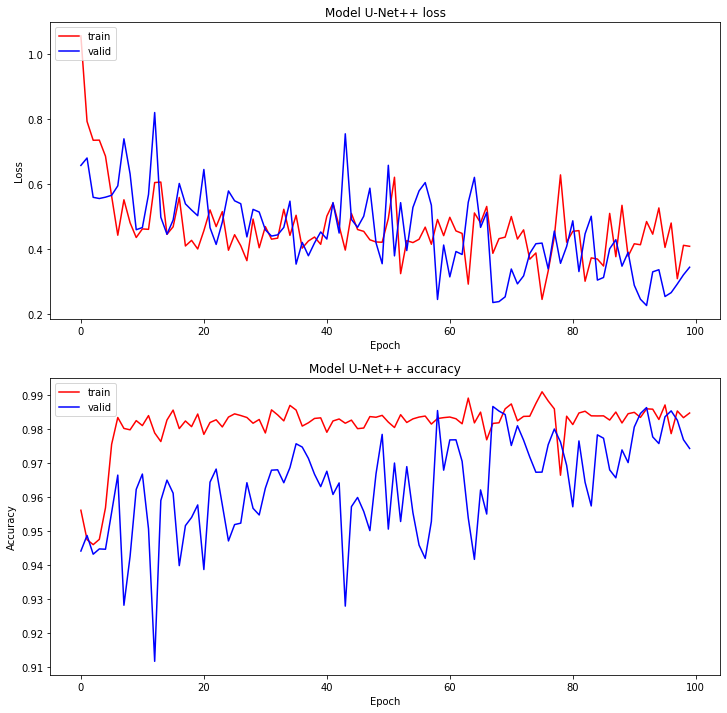

In [36]:
import matplotlib.pyplot as plt
import pandas as pd
training_unet_plus2_log = pd.read_csv("training_unet_plus2.log")

plt.figure(figsize=(12,12))
plt.subplot(2,1,1)
plt.plot(training_unet_plus2_log['loss'], 'r')
plt.plot(training_unet_plus2_log['val_loss'], 'b')
plt.title('Model U-Net++ loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
# plt.ylim(0,0.2)
plt.legend(['train', 'valid'], loc='upper left')

# plt.subplot(3,1,2)
# plt.plot(training_unet_plus2_log['mean_io_u_2'], 'r')
# plt.plot(training_unet_plus2_log['val_mean_io_u_2'], 'b')
# plt.title('Model U-Net++ mean_io_u')
# plt.ylabel('Mean IoU')
# plt.xlabel('Epoch')
# plt.legend(['train', 'valid'], loc='upper left')

plt.subplot(2,1,2)
plt.plot(training_unet_plus2_log['accuracy'], 'r')
plt.plot(training_unet_plus2_log['val_accuracy'], 'b')
plt.title('Model U-Net++ accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'valid'], loc='upper left')

plt.show()

U-Net++ 도 여전히 수렴 중으로 보인다. 

#### valid mean iou가 일정한 값으로 나오는 것에 대한 고민
결과가 valid에 영향을 못 준다.  
학습은 진행이 되었다.  
valid set을 만들때 라벨의 범위가 다르다   

#### U-Net 과 U-Net++ 모델 학습 결과 시각화

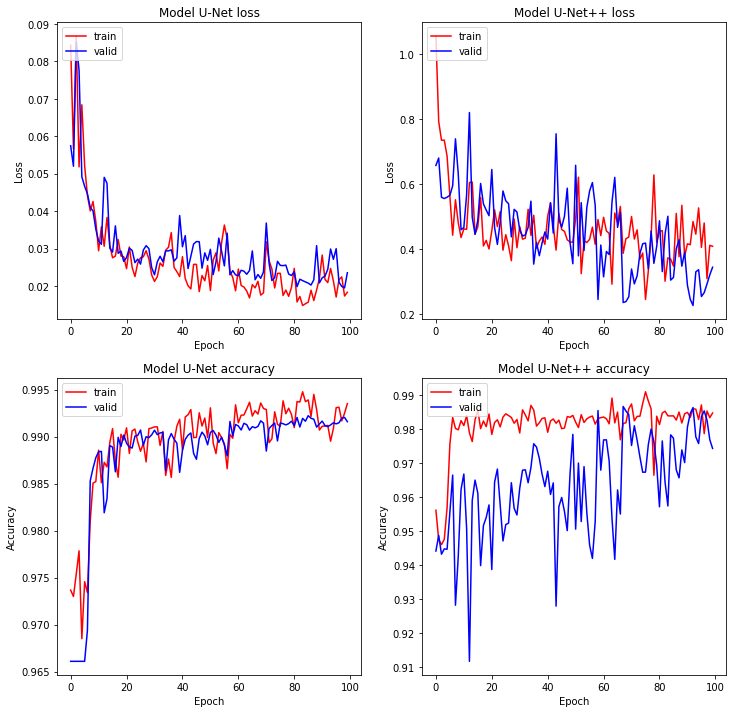

In [37]:
import matplotlib.pyplot as plt
import pandas as pd
training_unet_log = pd.read_csv("training_unet.log")
training_unet_plus2_log = pd.read_csv("training_unet_plus2.log")

## loss
plt.figure(figsize=(12,12))
plt.subplot(2,2,1)
plt.plot(training_unet_log['loss'], 'r')
plt.plot(training_unet_log['val_loss'], 'b')
plt.title('Model U-Net loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
# plt.ylim(0,0.2)
plt.legend(['train', 'valid'], loc='upper left')

plt.subplot(2,2,2)
plt.plot(training_unet_plus2_log['loss'], 'r')
plt.plot(training_unet_plus2_log['val_loss'], 'b')
plt.title('Model U-Net++ loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
# plt.ylim(0,0.2)
plt.legend(['train', 'valid'], loc='upper left')

# ## mean iou
# plt.subplot(3,2,3)
# plt.plot(training_unet_log['mean_io_u'], 'r')
# plt.plot(training_unet_log['val_mean_io_u'], 'b')
# plt.title('Model U-Net mean_io_u')
# plt.ylabel('Mean IoU')
# plt.xlabel('Epoch')
# plt.legend(['train', 'valid'], loc='upper left')

# plt.subplot(3,2,4)
# plt.plot(training_unet_plus2_log['mean_io_u_2'], 'r')
# plt.plot(training_unet_plus2_log['val_mean_io_u_2'], 'b')
# plt.title('Model U-Net++ mean_io_u')
# plt.ylabel('Mean IoU')
# plt.xlabel('Epoch')
# plt.legend(['train', 'valid'], loc='upper left')

## acc
plt.subplot(2,2,3)
plt.plot(training_unet_log['accuracy'], 'r')
plt.plot(training_unet_log['val_accuracy'], 'b')
plt.title('Model U-Net accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'valid'], loc='upper left')

plt.subplot(2,2,4)
plt.plot(training_unet_plus2_log['accuracy'], 'r')
plt.plot(training_unet_plus2_log['val_accuracy'], 'b')
plt.title('Model U-Net++ accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'valid'], loc='upper left')

plt.show()

어디가 오버피팅인지 언더피팅인지 모른다.  
metric을 통해 학습 정도를 살펴보자.  
pixel acc, IoU, 

#### dropout을 빼고 돌리면 어떻게 달라질까?
dropout은 빼야한다고 한다..  
빼고 돌리기보단 조금 줄였다.  

#### 모델 최적화 판단  
U-Net과 U-Net++ 모두 조금 더 돌려봐야될 것 같다.  

### Step 2-4 모델 추가 학습
epoch을 200으로 두고 돌린다.  

In [8]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

In [10]:
epoch = 200
UNet = build_unet_model()
unet_model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet.h5'
unet_model_dir = os.getenv('HOME') + '/aiffel/semantic_segmentation/checkpoints_unet/'

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(unet_model_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    ), 
    CSVLogger('training_unet.log')
]

UNet.compile(
    optimizer = Adam(1e-4), 
    loss = 'binary_crossentropy',
    metrics = [
#         tf.keras.metrics.MeanIoU(num_classes=2), 
        "accuracy" ## "binary_accuracy"
    ]
)

history_UNet = UNet.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=epoch,
    callbacks=callbacks_list
 )

UNet.save(unet_model_path)  

Epoch 1/200
22/22 [==============================] - 10s 396ms/step - loss: 0.6678 - accuracy: 0.9611 - val_loss: 0.5291 - val_accuracy: 0.9661

Epoch 00001: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_1
Epoch 2/200
22/22 [==============================] - 8s 373ms/step - loss: 0.3292 - accuracy: 0.9796 - val_loss: 0.5230 - val_accuracy: 0.9661

Epoch 00002: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_2
Epoch 3/200
22/22 [==============================] - 8s 368ms/step - loss: 0.5346 - accuracy: 0.9653 - val_loss: 0.4686 - val_accuracy: 0.9661

Epoch 00003: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_3
Epoch 4/200
22/22 [==============================] - 8s 371ms/step - loss: 0.1136 - accuracy: 0.9722 - val_loss: 0.0638 - val_accuracy: 0.9661

Epoch 00004: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_4
Epoch 5/200
22/22 [========

In [11]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

In [12]:
UNet_plus2 = build_unet_plus2_model()
unet_plus2_model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_plus2.h5'
unet_plus2_model_dir = os.getenv('HOME') + '/aiffel/semantic_segmentation/checkpoints_unet_plus2/'

callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(unet_plus2_model_dir, "weights" + "_epoch_{epoch}"),
        monitor="loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    ), 
    CSVLogger('training_unet_plus2.log')
]

UNet_plus2.compile(
    optimizer = Adam(1e-4), 
    loss = bce_dice_loss, 
    metrics = [
#         tf.keras.metrics.MeanIoU(num_classes=2), 
        "accuracy"
    ]
)

history_UNet_plus2 = UNet_plus2.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=epoch,
    callbacks=callbacks_list
 )

UNet_plus2.save(unet_plus2_model_path)  

Epoch 1/200
22/22 [==============================] - 18s 423ms/step - loss: 1.1307 - accuracy: 0.9428 - val_loss: 0.9679 - val_accuracy: 0.9604

Epoch 00001: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_1
Epoch 2/200
22/22 [==============================] - 9s 406ms/step - loss: 0.8244 - accuracy: 0.9544 - val_loss: 0.6008 - val_accuracy: 0.9485

Epoch 00002: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_2
Epoch 3/200
22/22 [==============================] - 9s 409ms/step - loss: 0.7002 - accuracy: 0.9501 - val_loss: 0.5512 - val_accuracy: 0.9428

Epoch 00003: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_3
Epoch 4/200
22/22 [==============================] - 9s 407ms/step - loss: 0.6073 - accuracy: 0.9653 - val_loss: 0.4200 - val_accuracy: 0.9728

Epoch 00004: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_4
Epo

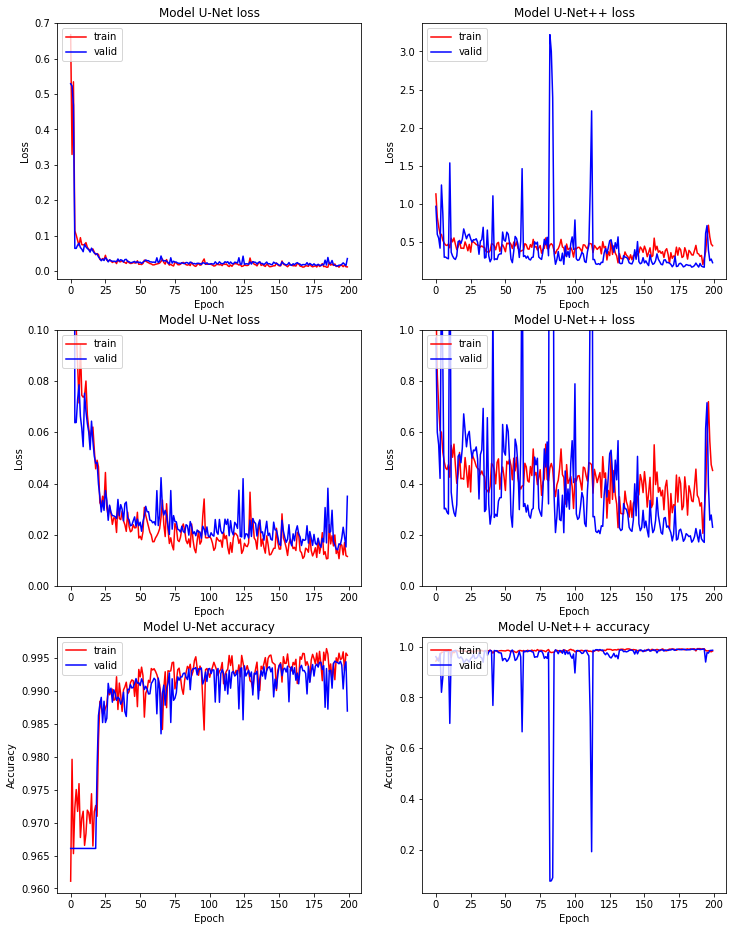

In [15]:
import matplotlib.pyplot as plt
import pandas as pd
training_unet_log = pd.read_csv("training_unet.log")
training_unet_plus2_log = pd.read_csv("training_unet_plus2.log")

## loss
plt.figure(figsize=(12,16))
plt.subplot(3,2,1)
plt.plot(training_unet_log['loss'], 'r')
plt.plot(training_unet_log['val_loss'], 'b')
plt.title('Model U-Net loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
# plt.ylim(0,0.1)
plt.legend(['train', 'valid'], loc='upper left')

plt.subplot(3,2,2)
plt.plot(training_unet_plus2_log['loss'], 'r')
plt.plot(training_unet_plus2_log['val_loss'], 'b')
plt.title('Model U-Net++ loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
# plt.ylim(0,0.1)
plt.legend(['train', 'valid'], loc='upper left')

## loss
plt.subplot(3,2,3)
plt.plot(training_unet_log['loss'], 'r')
plt.plot(training_unet_log['val_loss'], 'b')
plt.title('Model U-Net loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.ylim(0,0.1)
plt.legend(['train', 'valid'], loc='upper left')

plt.subplot(3,2,4)
plt.plot(training_unet_plus2_log['loss'], 'r')
plt.plot(training_unet_plus2_log['val_loss'], 'b')
plt.title('Model U-Net++ loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.ylim(0,1)
plt.legend(['train', 'valid'], loc='upper left')

## acc
plt.subplot(3,2,5)
plt.plot(training_unet_log['accuracy'], 'r')
plt.plot(training_unet_log['val_accuracy'], 'b')
plt.title('Model U-Net accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'valid'], loc='upper left')

plt.subplot(3,2,6)
plt.plot(training_unet_plus2_log['accuracy'], 'r')
plt.plot(training_unet_plus2_log['val_accuracy'], 'b')
plt.title('Model U-Net++ accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'valid'], loc='upper left')

plt.show()

에폭을 200으로 돌려도 U-Net과 U-Net++ 모델은 과적합이 덜된 것 같다.  
중간에 톡톡 튀는 에폭도 있는데 이는 dropout의 영향이지 않을까 싶다.  
U-Net과 U-Net++ 모두 마지막 근처에서 낮은 val_loss를 가지면서 높은 val_acc를 갖는 가중치를 선택한다.  

### Step 2-5. 최적화된 모델 판단하고 불러오기

#### U-Net
Epoch 00192: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet/weights_epoch_192  
Epoch 193/200  
loss: 0.0143 - accuracy: 0.9944 - val_loss: 0.0141 - val_accuracy: 0.9943  

In [16]:
cp_UNet = build_unet_model()
cp_UNet.load_weights(unet_model_dir + "weights_epoch_192")

#### U-Net++
Epoch 00193: saving model to /aiffel/aiffel/semantic_segmentation/checkpoints_unet_plus2/weights_epoch_193  
Epoch 194/200  
loss: 0.2924 - accuracy: 0.9911 - val_loss: 0.1698 - val_accuracy: 0.9901  

In [17]:
cp_UNet_plus2 = build_unet_plus2_model()
cp_UNet_plus2.load_weights(unet_plus2_model_dir + "weights_epoch_193")

### Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석
1. 시각화
2. IoU 계산

In [18]:
def calculate_iou_score(target, prediction):
    intersection = tf.reduce_sum(tf.cast(target * prediction, tf.float32))
    union = tf.reduce_sum(tf.cast(target + prediction - target * prediction, tf.float32))
    iou_score = float(intersection) / float(union) if union != 0 else 0.0
    print('IoU : %f' % iou_score )
    return iou_score

In [19]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

In [33]:
def check_result(model, test_preproc, i):
    output, prediction, target = get_output(
         model, 
         test_preproc,
         image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
         output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
         label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
     )

    calculate_iou_score(target, prediction)

## U-Net     115


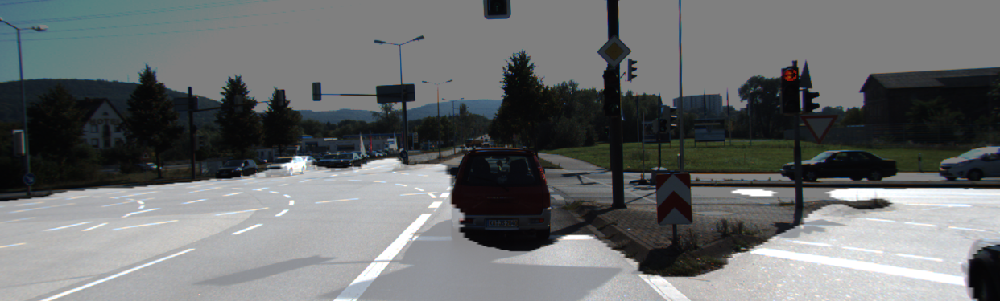

IoU : 0.869795
## U-Net++   115


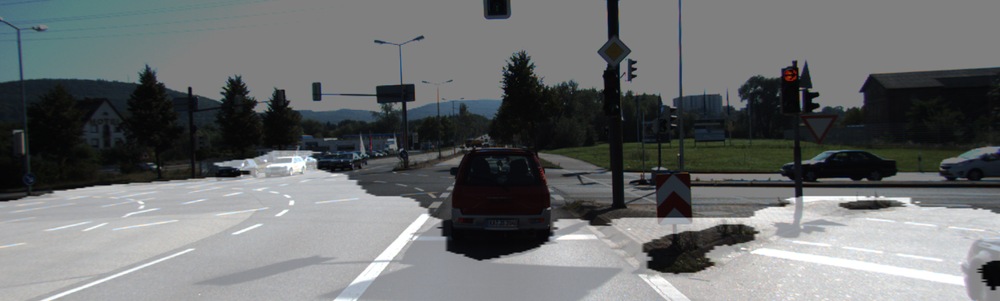

IoU : 0.769373


In [21]:
import random
random_number = random.randint(0, 199)
print(f"## U-Net     {random_number}")
check_result(cp_UNet, test_preproc, random_number)
print(f"## U-Net++   {random_number}")
check_result(cp_UNet_plus2, test_preproc, random_number)

## U-Net     55


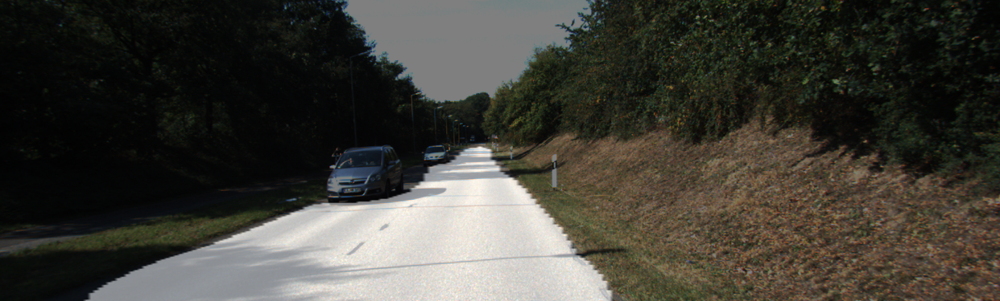

IoU : 0.861270
## U-Net++   55


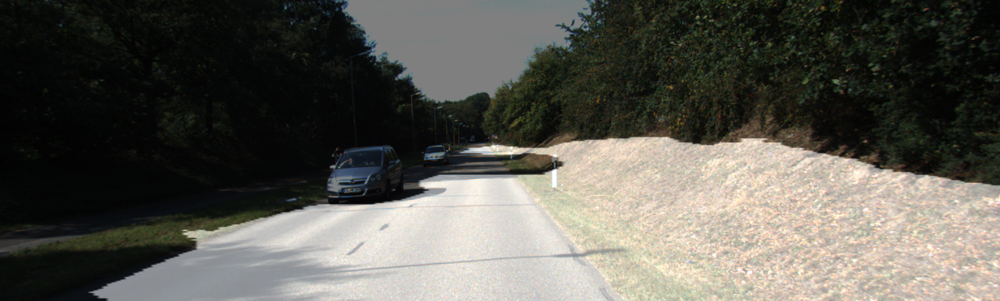

IoU : 0.360658


In [22]:
random_number = random.randint(0, 199)
print(f"## U-Net     {random_number}")
check_result(cp_UNet, test_preproc, random_number)
print(f"## U-Net++   {random_number}")
check_result(cp_UNet_plus2, test_preproc, random_number)

## U-Net     161


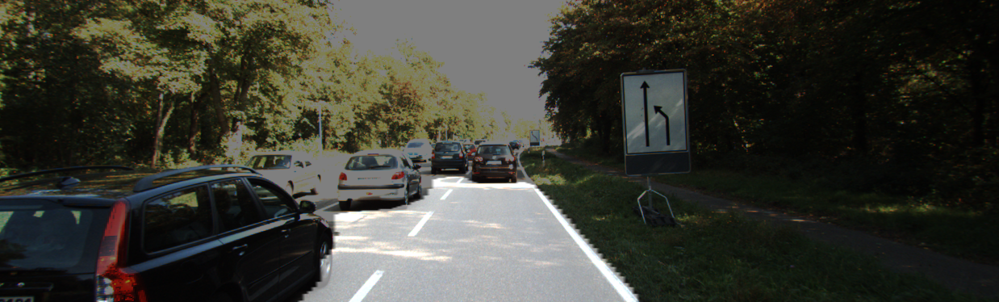

IoU : 0.881391
## U-Net++   161


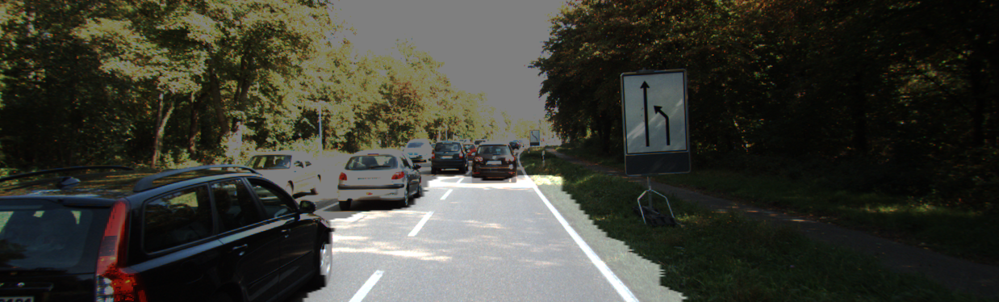

IoU : 0.782536


In [23]:
random_number = random.randint(0, 199)
print(f"## U-Net     {random_number}")
check_result(cp_UNet, test_preproc, random_number)
print(f"## U-Net++   {random_number}")
check_result(cp_UNet_plus2, test_preproc, random_number)

## U-Net     7


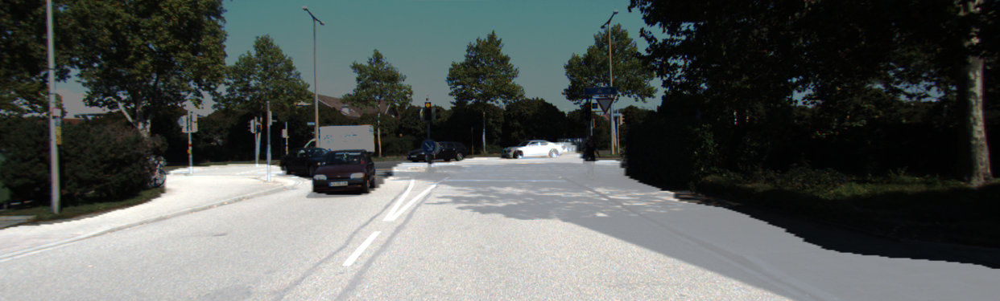

IoU : 0.733376
## U-Net++   7


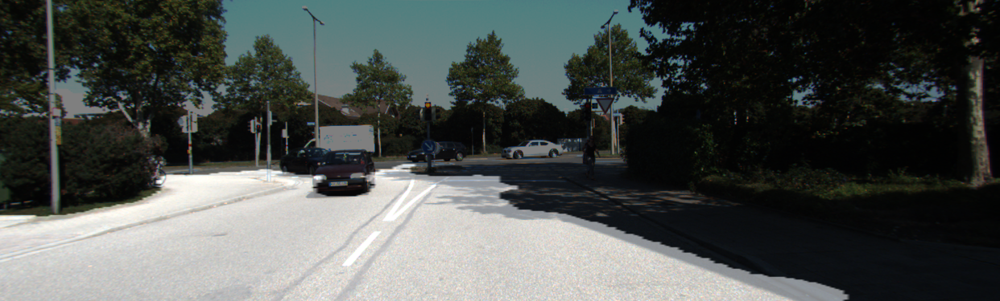

IoU : 0.773792


In [25]:
random_number = random.randint(0, 199)
print(f"## U-Net     {random_number}")
check_result(cp_UNet, test_preproc, random_number)
print(f"## U-Net++   {random_number}")
check_result(cp_UNet_plus2, test_preproc, random_number)

## U-Net     197


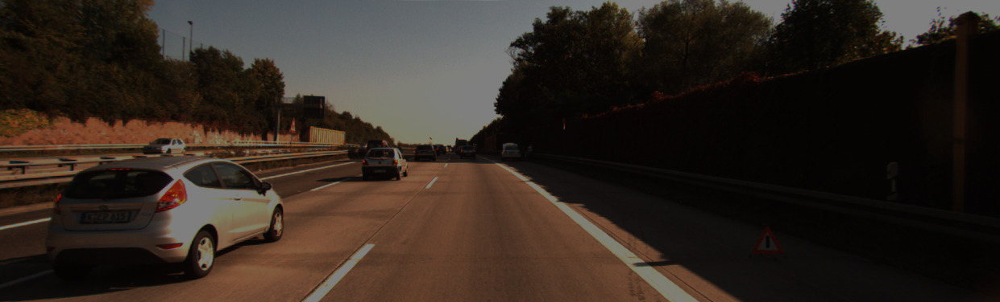

IoU : 0.000000
## U-Net++   197


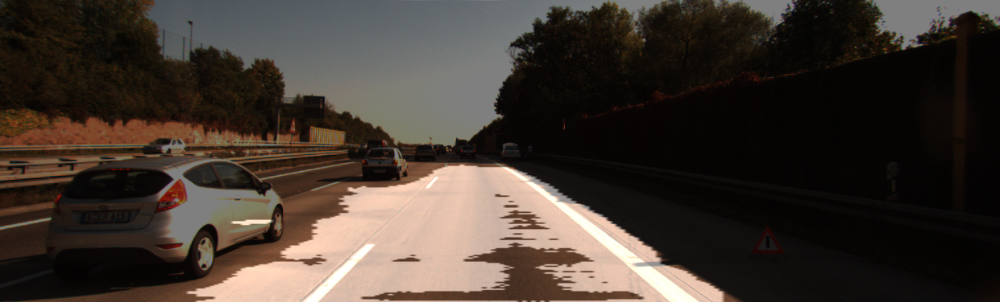

IoU : 0.456966


In [31]:
random_number = random.randint(0, 199)
print(f"## U-Net     {random_number}")
check_result(cp_UNet, test_preproc, random_number)
print(f"## U-Net++   {random_number}")
check_result(cp_UNet_plus2, test_preproc, random_number)

#### U-Net 과 U-Net++의 결과 비교
대부분의 test셋에 대해 U-Net이 높은 성능을 보였다.  

### `루브릭 1` U-Net을 통한 세그멘테이션 작업이 정상적으로 진행되었는가?

### `루브릭 3` U-Net과 U-Net++ 두 모델의 성능이 정량적/정성적으로 잘 비교되었는가?